<a href="https://colab.research.google.com/github/lewisjustin749/Image-Processing/blob/main/ImageProcessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



```
# Justin Lewis
```



# Image Processing Assignment

Implement the basic image processing methods we've discussed in class: convolution/correlation, color histogram analysis, Canny edge detection.


In [ ]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive/')

In [ ]:
# After executing the cell above, Drive
# files will be present in "/content/drive/My Drive".
!ls "/content/drive/My Drive/Colab Notebooks"

 Color.ipynb				       Math_Review_Justin_Lewis.ipynb
'Copy of MathandPythonReview.ipynb'	       puzzle_1.jpg
 eureka-vacuum-small.png		       query_1.jpg
 group-parrot-small.png			       single-parrot-small.png
 ImageProcessingAssignment.ipynb	       Threshold.ipynb
 JustinLewis_ImageProcessingAssignment.ipynb   Untitled
 MathandPythonReview.ipynb


## 1D Convolution
After loading the staircaase image included with scipy.misc
1. Calculate the height and width of the staircase image and display the image
2. Retrieve the first row of the image
3. Create a numpy array with the finite difference filter [-1, 1]
4. Apply the filter to one row of the image (no need to reverse it for convolution).  Please implement this yourself only using NumPy functions but not OpenCV or scipy
5. Plot the intensity of the first row and the output of the finite difference filter on a graph (the x value should be the index and the y value the intensity) 


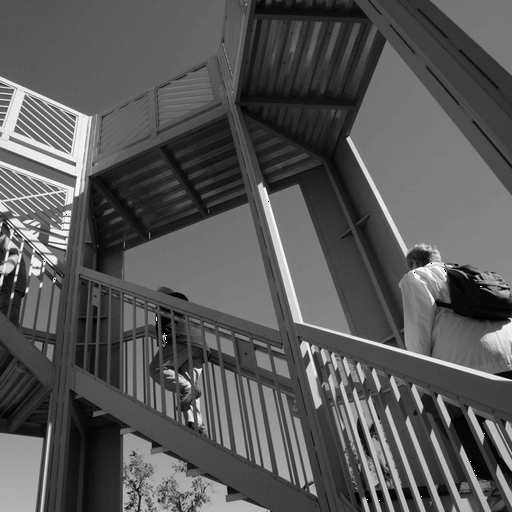

(512, 512)
height: 512 pixels
width: 512 pixels




In [ ]:
#Required to use the imshow command within colab
from google.colab.patches import cv2_imshow

#Numpy, Matplotlib and OpenCV are required
import cv2
import matplotlib.pyplot as plt
import numpy as np

from scipy import misc
#load the staircase image
ascent=misc.ascent() 

cv2_imshow(ascent)

#what are the dimensions of the image?
print(ascent.shape)
print("height: %d pixels" % (ascent.shape[0]))
print("width: %d pixels" % (ascent.shape[1]))
print('\n')

In [ ]:
#retrieve the first row
A = ascent[0]
print("First Row of Photo")
print(A)
print('\n')

First Row of Photo
[ 83  83  83  83  83  83  83  82  82  82  82  82  82  82  82  82  82  83
  83  83  83  83  83  83  82  82  82  82  82  82  82  82  82  85  86  85
  85  85  86  86  86  85  85  85  85  85  85  85  85  85  85  85  85  85
  85  85  85  85  86  84  85  86  85  85  85  85  86  88  87  87  87  87
  87  87  87  87  87  87  87  87  87  87  87  87  87  87  87  87  87  87
  87  87  87  87  89  91  90  91  90  90  90  90  91  88  87  90  90  90
  90  90  90  90  90  90  90  90  90  90  90  90  90  91  91  90  90  90
  90  90  90  91  92  92  92  92  92  92  92  92  92  92  92  92  92  92
  92  92  92  92  92  92  92  92  92  92  92  93  95  95  96  93  92  95
  95  95  95  95  95  95  95  95  95  95  95  95  95  95  95  95  95  95
  95  95  95  95  95  95  95  95  95  97  97  97  97  97  97  97  97  97
  97  97  97  97  97  97  97  97  97  97  97  97  97  97 100 100  97  97
  97  99 101 100 100 100 100 101  98  94  79  81  82  84  82  86  84  86
  78  82  77  79  73  80  89  88

In [ ]:
#create the 1x2 finite difference filter
x = np.array([-1,1])
#filter the row
n = np.convolve(A,x, 'same')
print('Filtered first row of image')
print(n)
print('\n')

Filtered first row of image
[-83   0   0   0   0   0   0   1   0   0   0   0   0   0   0   0   0  -1
   0   0   0   0   0   0   1   0   0   0   0   0   0   0   0  -3  -1   1
   0   0  -1   0   0   1   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0  -1   2  -1  -1   1   0   0   0  -1  -2   1   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0  -2  -2   1  -1   1   0   0   0  -1   3   1  -3   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0  -1   0   1   0   0
   0   0   0  -1  -1   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0  -1  -2   0  -1   3   1  -3
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0  -2   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0  -3   0   3   0
   0  -2  -2   1   0   0   0  -1   3   4  15  -2  -1  -2   2  -4   2  -2
   8  -4   5  -2   6  -

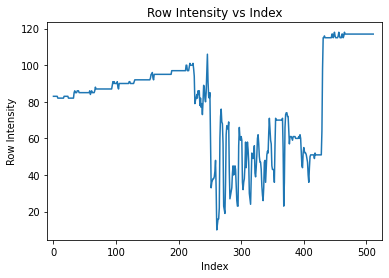

In [ ]:
#plot the image intensity and the filter output using plt.plot
plt.title('Row Intensity vs Index')
plt.xlabel("Index")
plt.ylabel("Row Intensity")
plt.plot(ascent[0])
plt.xlim([-10,525])
plt.show()
print('\n')

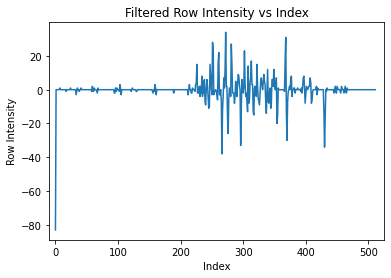

In [ ]:
plt.title('Filtered Row Intensity vs Index')
plt.xlabel("Index")
plt.ylabel("Row Intensity")
plt.plot(n)
plt.xlim([-10,525])
plt.show()

# 2D Linear Filters
1. Create 3x3 numpy arrays for the linear filter to highlight vertical edges and horizontal edges (consult Lecture 5)
2. Apply signal.convolve2d (see reference guide https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.convolve2d.html)
3. Display the original image and the 2 filtered images

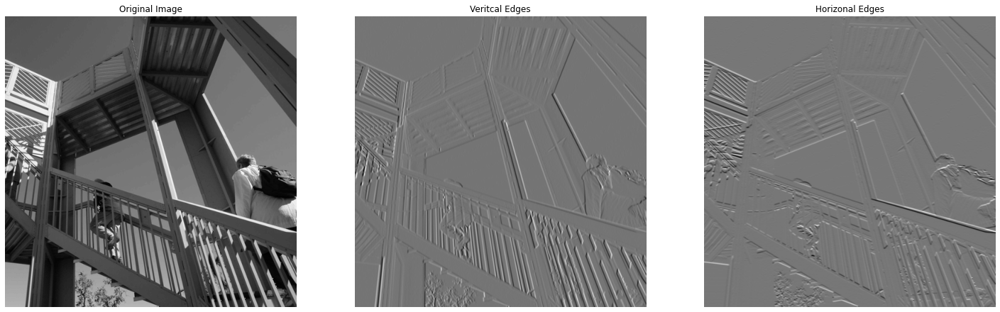

In [ ]:
from scipy import signal
from scipy import misc
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
ascent=misc.ascent()

#create the numpy filters

# Vertical Edges
ve = np.array([[-1,0,1], 
               [-1,0,1],
               [-1,0,1]])

# Horizontal Edges
he = np.array([[1,1,1], 
               [0,0,0],
               [-1,-1,-1]])

#apply them using signal.convolve2d
vef = signal.convolve2d(ascent, ve, boundary='symm', mode='same')
hef = signal.convolve2d(ascent, he, boundary='symm', mode='same')

#display the original image and the filtered images

# Used subplots to display three images side by side
# Original Image
(fig, (ax1, ax2, ax3)) = plt.subplots(1, 3, figsize=(25, 25))
ax1.title.set_text('Original Image')
ax1.imshow(ascent, cmap='gray')
ax1.axis('off')

# Show Vertical Edges
ax2.title.set_text('Veritcal Edges')
ax2.imshow(vef, cmap='gray')
ax2.axis('off')

# Show Horizontal Edges 
ax3.title.set_text('Horizonal Edges')
ax3.imshow(hef, cmap='gray')
ax3.axis('off')
plt.show()


## OpenCV Template Matching
Evaluate the performance of 2 OpenCV template matching options (cv2.TM_COEFF and TM_CCORR) at finding Waldo.  You are allowed to use any OpenCV methods that you wish.
https://docs.opencv.org/master/d4/dc6/tutorial_py_template_matching.html
1. Load and display the puzzle image and the query image. Calculate the height and the width of the query image (Waldo).  
2. Apply the template matching method and display the result.
3. Find the location of the max value in the result.
4. Make a copy of the puzzle image using copy() and draw a rectangle on the maximum location.  To size the rectangle, use the height and width of the Waldo query image. (the reason you are making a copy is to avoid drawing rectangles from both the methods on the same image).
5. Display the image with the rectangle drawn.
6. Repeat the procedure using the other method
7. Report which method correctly finds Waldo.



In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

Load puzzle image and display it

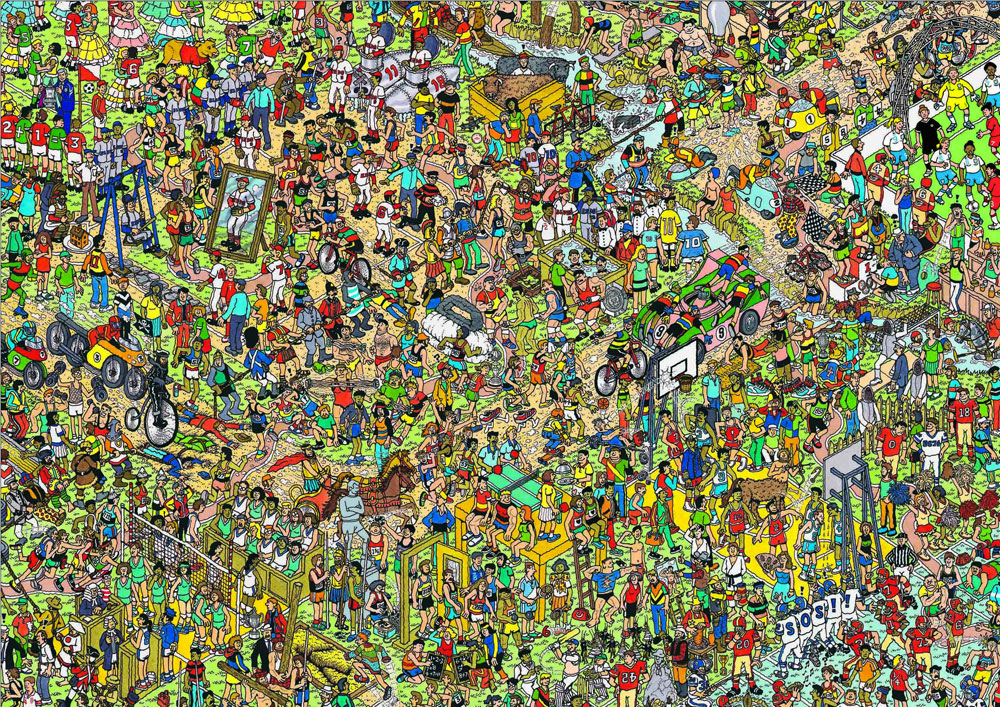

In [ ]:
scene = cv2.imread("/content/drive/My Drive/Colab Notebooks/puzzle_1.jpg")
scene.shape
cv2_imshow(scene)

Load query image and display it

In [ ]:
waldo = cv2.imread("/content/drive/My Drive/Colab Notebooks/query_1.jpg")
cv2_imshow(waldo)

Get the dimensions of Waldo's image

In [ ]:
waldo.shape

(33, 15, 3)

Perform template matching using the matchTemplate function in openCV which slides template image over scene image and get scores for matches at each position

Try using both cv2.TM_COEFF and TM_CCORR

Report which one gets the correct answer.

Template Mathcing using cv2.TM_CCOEFF method


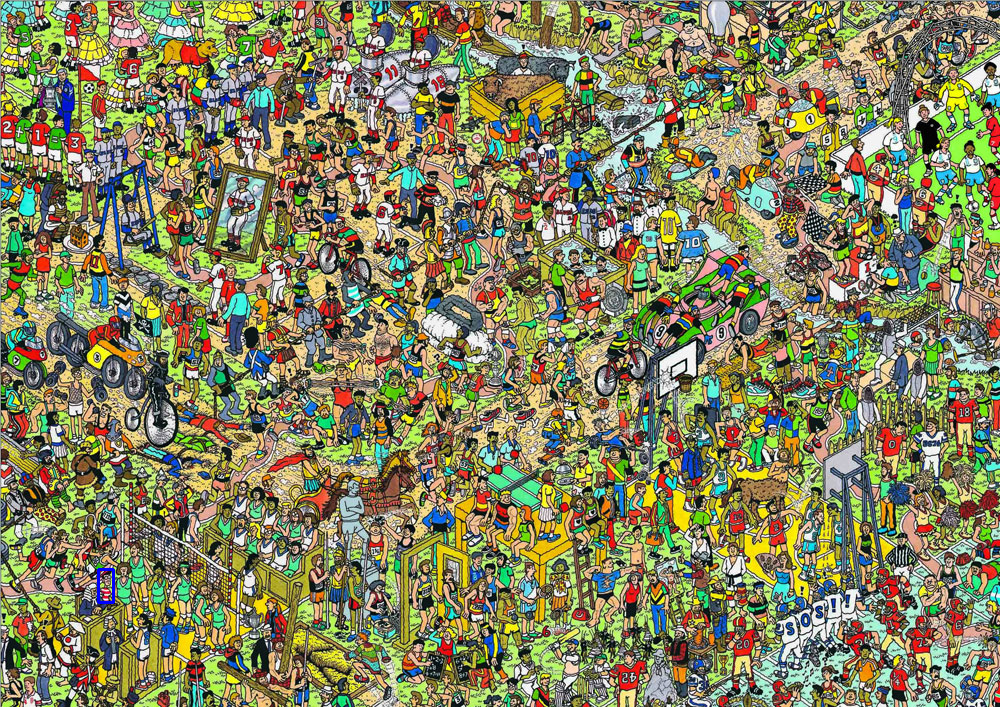

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Read images
scene = cv2.imread("/content/drive/My Drive/Colab Notebooks/puzzle_1.jpg") 
waldo = cv2.imread("/content/drive/My Drive/Colab Notebooks/query_1.jpg")

# convert both the image and template to grayscale
imageGray = cv2.cvtColor(scene, cv2.COLOR_BGR2GRAY)
templateGray = cv2.cvtColor(waldo, cv2.COLOR_BGR2GRAY)

scene1 = scene.copy()
scene2 = scene.copy()

imageGray_copied_image = imageGray.copy()
templateGray_copied_image = templateGray.copy()

result = cv2.matchTemplate(imageGray, templateGray, cv2.TM_CCOEFF)
result1 = cv2.matchTemplate(imageGray_copied_image, templateGray_copied_image, cv2.TM_CCORR)
(minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(result)
(minVal1, maxVal1, minLoc1, maxLoc1) = cv2.minMaxLoc(result1)

top_left = maxLoc
bottom_right = (top_left[0] + waldo.shape[1], top_left[1] + waldo.shape[0])

top_left1 = maxLoc1
bottom_right1 = (top_left1[0] + waldo.shape[1], top_left1[1] + waldo.shape[0])

cv2.rectangle(scene1,top_left, bottom_right, 255, 2)
cv2.rectangle(scene2,top_left1, bottom_right1, 255, 2)

print('Template Mathcing using cv2.TM_CCOEFF method')
cv2_imshow(scene1)
print('\n')

Template Mathcing using cv2.TM_CCORR method


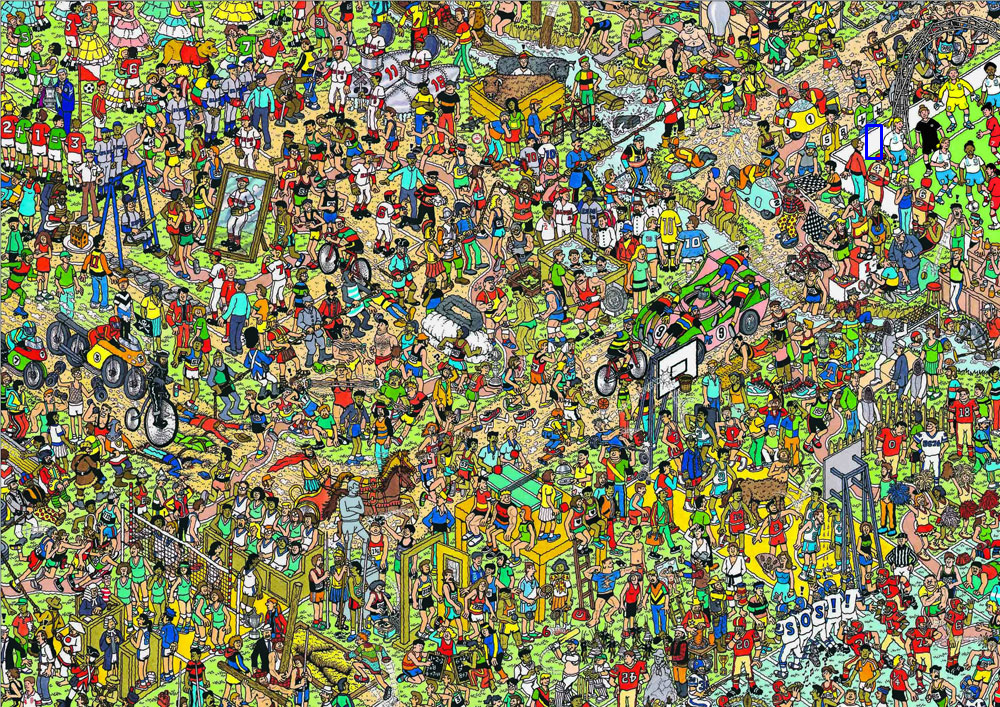

In [ ]:
print('Template Mathcing using cv2.TM_CCORR method')
cv2_imshow(scene2)

In [ ]:
print("\ncv2.TM_CCOEFF method correctly finds Waldo")


cv2.TM_CCOEFF method correctly finds Waldo


Display the results using Matplotlib

(-0.5, 999.5, 706.5, -0.5)

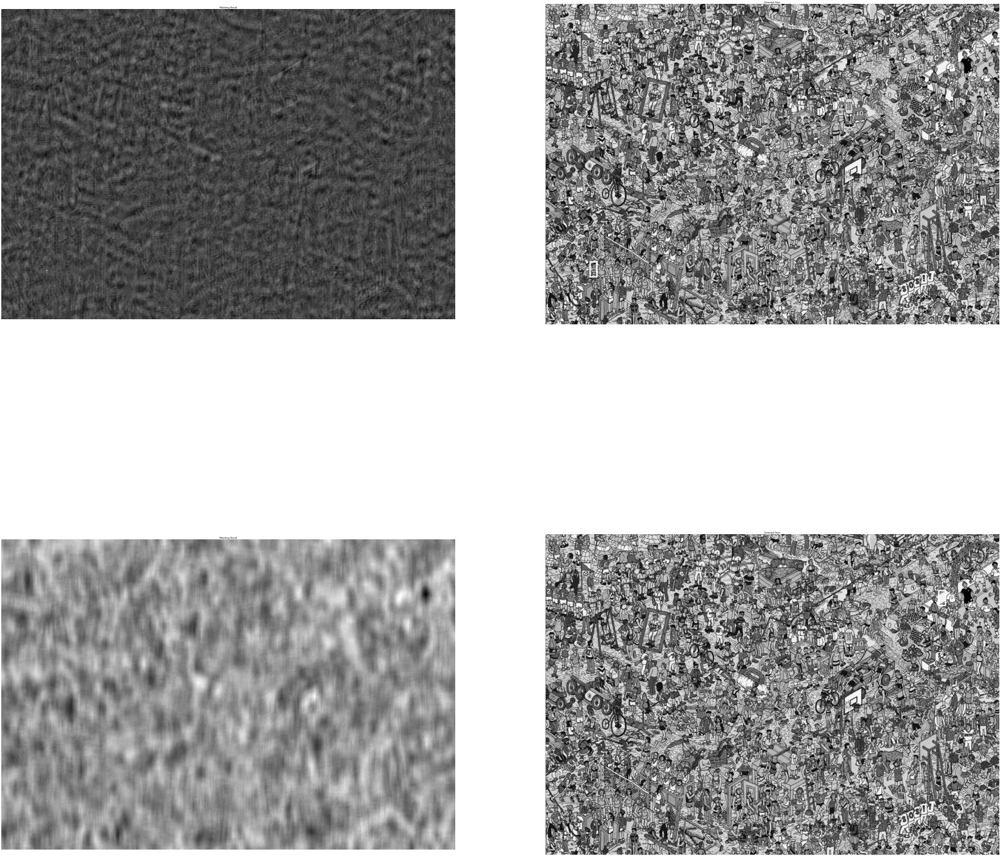

In [ ]:
cv2.rectangle(imageGray,top_left, bottom_right, 255, 2)
cv2.rectangle(imageGray_copied_image,top_left1, bottom_right1, 255, 2)

fig, axs = plt.subplots(2, 2, figsize=(100, 100),dpi =20)
axs[0, 0].imshow(result,cmap = 'gray')
axs[0, 0].set_title('Matching Result')
axs[0,0].axis('off')
axs[0, 1].imshow(imageGray,cmap = 'gray')
axs[0, 1].set_title('Detected Point')
axs[0,1].axis('off')
axs[1, 0].imshow(result1,cmap = 'gray')
axs[1, 0].set_title('Matching Result')
axs[1,0].axis('off')
axs[1, 1].imshow(imageGray_copied_image,cmap = 'gray')
axs[1, 1].set_title('Detected Point')
axs[1,1].axis('off')

Find the highest score and print the location where it is located in the image

In [ ]:
print("High Score using cv2.TM_CCOEFF method:")
print("Topleft:", top_left)
print("bottom_right:", bottom_right)

print("\n")

print("High Score using cv2.TM_CCORR method:")
print("Topleft:", top_left1)
print("bottom_right:", bottom_right1)

High Score using cv2.TM_CCOEFF method:
Topleft: (98, 569)
bottom_right: (113, 602)


High Score using cv2.TM_CCORR method:
Topleft: (866, 125)
bottom_right: (881, 158)


Make a copy of puzzle image

In [ ]:
copied_image = scene.copy()
copied_image1 = scene.copy()

Draw rectangle on image where the best score is found using a color that the TA can see using cv2.rectangle and display the image

In [ ]:
# Rectangle using cv2.TM_CCOEFF method
cv2.rectangle(copied_image,top_left, bottom_right, 255, 2)

# Rectangle using cv2.TM_CCORR method
cv2.rectangle(copied_image1,top_left1, bottom_right1, 255, 2)

array([[[169, 179, 173],
        [109, 127, 120],
        [142, 159, 150],
        ...,
        [152, 142, 142],
        [143, 138, 140],
        [122, 122, 128]],

       [[108, 121, 113],
        [ 96, 161, 140],
        [ 95, 196, 164],
        ...,
        [ 56,  41,  15],
        [ 64,  47,  26],
        [ 64,  44,  27]],

       [[137, 155, 142],
        [ 94, 207, 173],
        [ 56, 240, 186],
        ...,
        [ 75,  60,  11],
        [ 82,  57,  13],
        [147, 105,  63]],

       ...,

       [[152, 153, 163],
        [ 20,  55,  45],
        [ 91, 195, 154],
        ...,
        [ 29,  25,  20],
        [ 29,  27,  19],
        [ 24,  24,  10]],

       [[138, 139, 149],
        [ 18,  53,  43],
        [ 99, 203, 162],
        ...,
        [ 24,  20,  15],
        [ 28,  26,  18],
        [ 25,  25,  11]],

       [[132, 133, 143],
        [ 67, 102,  92],
        [133, 237, 196],
        ...,
        [ 26,  22,  17],
        [ 22,  20,  12],
        [ 22,  22,   8]]

Display image using OpenCV

Template Mathcing using cv2.TM_CCOEFF method


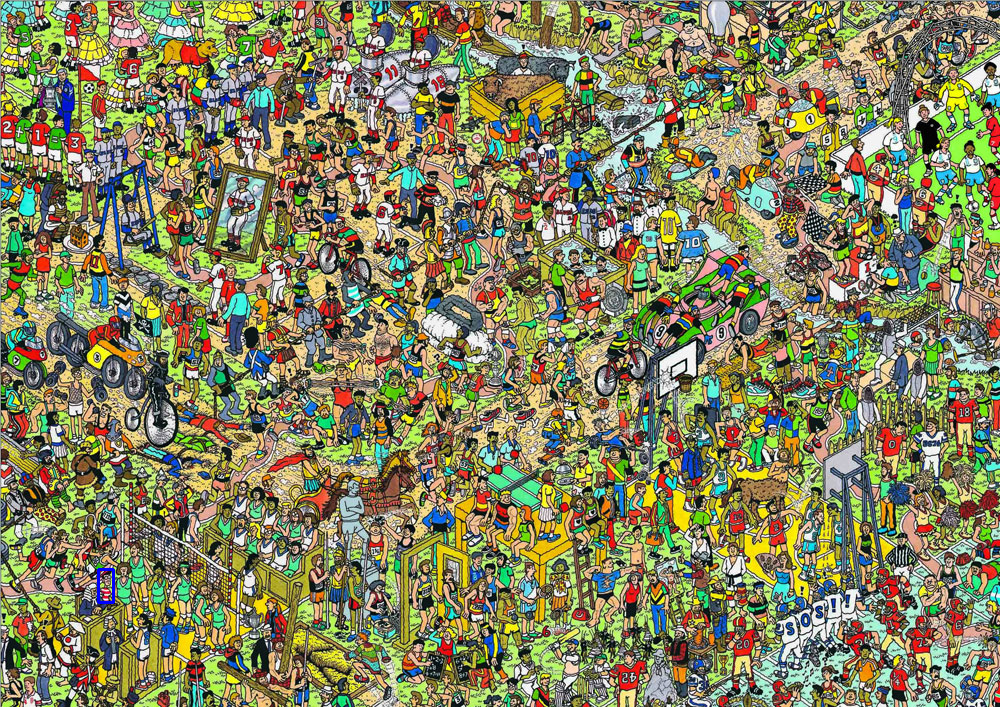

In [ ]:
from google.colab.patches import cv2_imshow

print('Template Mathcing using cv2.TM_CCOEFF method')
cv2_imshow(copied_image)

Template Mathcing using cv2.TM_CCORR method


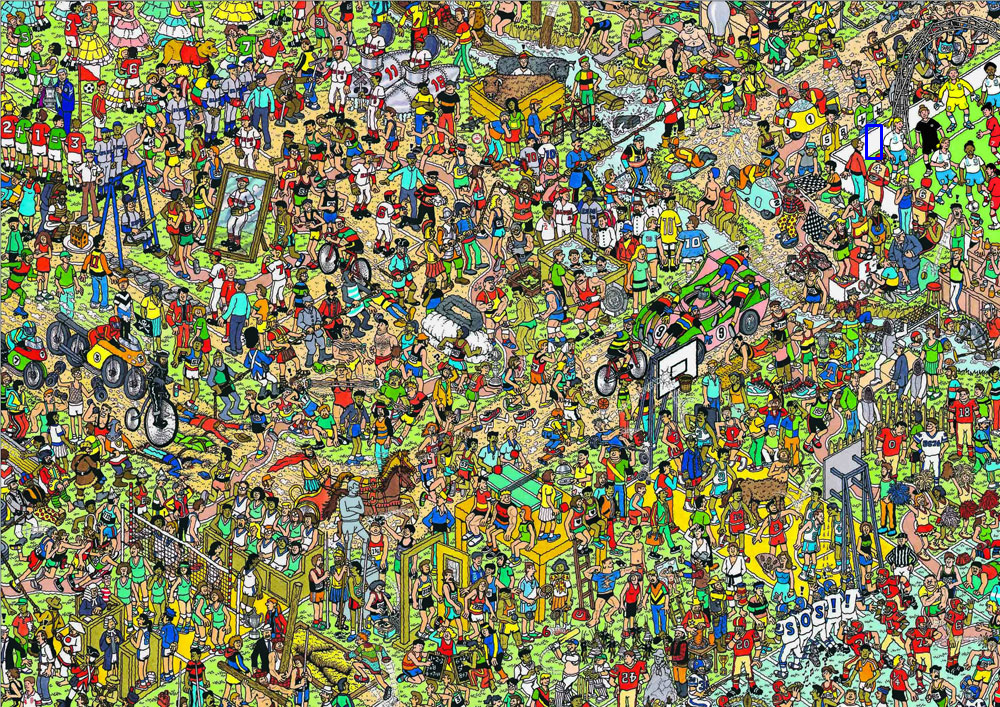


cv2.TM_CCOEFF method correctly finds Waldo


In [ ]:
print('Template Mathcing using cv2.TM_CCORR method')
cv2_imshow(copied_image1)
print("\ncv2.TM_CCOEFF method correctly finds Waldo")

## Color Histograms

1. Load the images of the parrot, group of parrots and the vacuum cleaner.
2. Display the images.
3. Calculate the color histogram of the images and normalize them. Please consult the OpenCV documentation for this: https://docs.opencv.org/3.4/d8/dbc/tutorial_histogram_calculation.html  Remember that by default openCV loads images using BGR convention.
4. Plot the color histograms for the blue, green, and red values (preferably on the same axes using a bin size of 256)).  Do this for each of the three images.
5. Recalculate the histograms using bin sizes of [8, 8, 8] for b,g,r and compare them using compareHist cv2.HISTCMP_INTERSECT (intersection).  Print the results of comparing the parrot image to itself, to the group of parrots and to the vacuum cleaner.

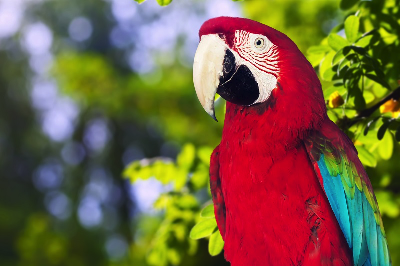

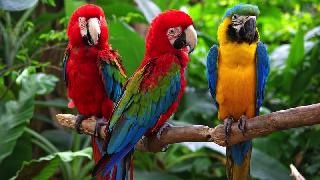

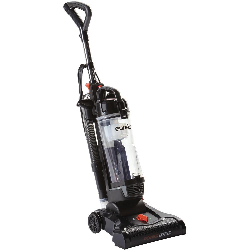



Parrot (Bins 256) PNG Histogram:


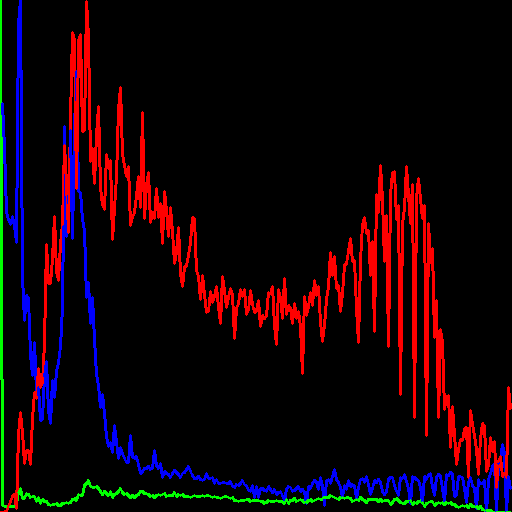



Parrot Group (Bins 256) PNG Histogram:


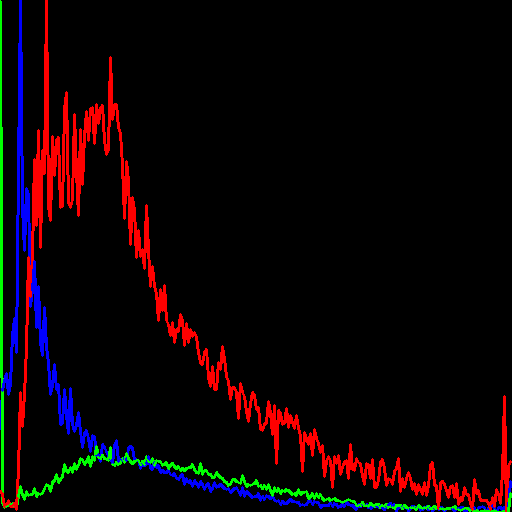



Vacuum (Bins 256) PNG Histogram:


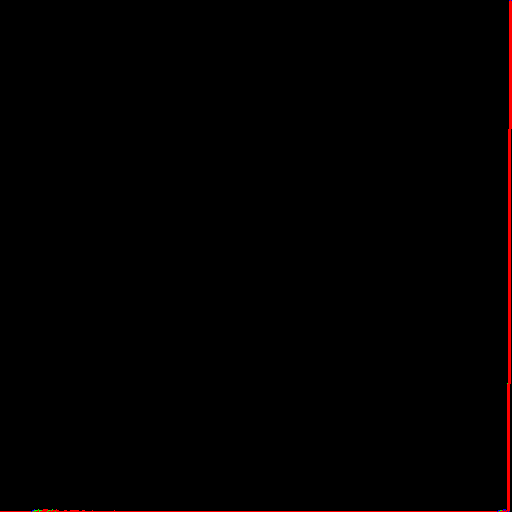



Parrot (Bins 8) PNG Histogram:


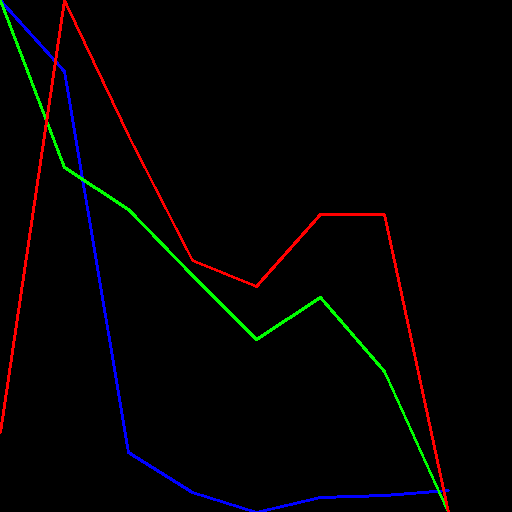



Parrot Group (Bins 8) PNG Histogram:


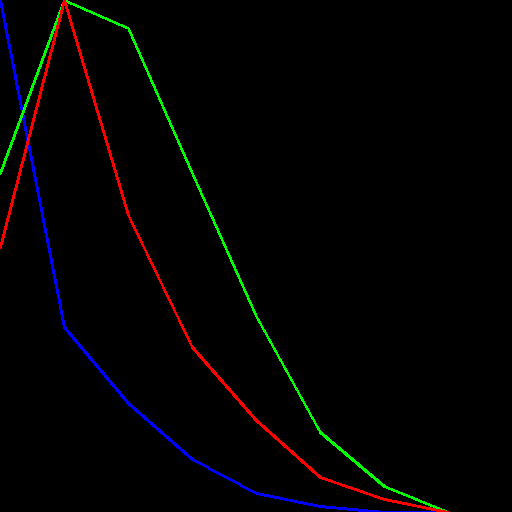



Vacuum PNG (Bins 8) Histogram:


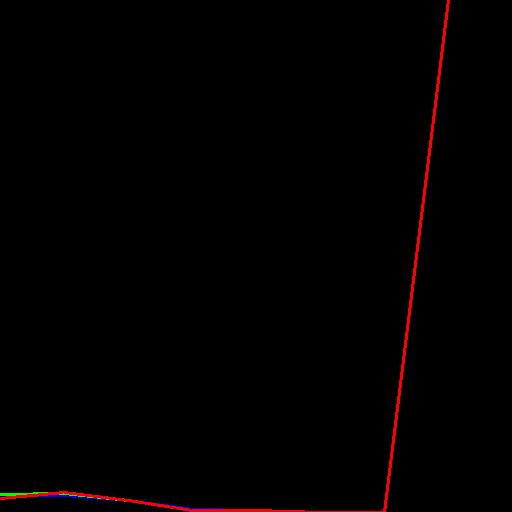



-------------------------------  -----------------------------
Compared Histograms              Intersection Value Comparison
Parrot to Parrot                 56709.888447999954
Parrot to Group Parrot           35976.7353515625
Parrot to Vacuum                 613.1559950448573
Parrot to Parrot (8 Bins)        2045.7475509643555
Parrot to Group Parrot (8 Bins)  1381.6300811767578
parrot to Vacuum (8 Bins)        565.9353451728821
-------------------------------  -----------------------------


In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
from tabulate import tabulate as table

parrot = cv2.imread("/content/drive/My Drive/Colab Notebooks/single-parrot-small.png")
parrot_group = cv2.imread("/content/drive/My Drive/Colab Notebooks/group-parrot-small.png")
vacuum = cv2.imread("/content/drive/My Drive/Colab Notebooks/eureka-vacuum-small.png")

cv2_imshow(parrot)
cv2_imshow(parrot_group)
cv2_imshow(vacuum)
print('\n')

# Plot color histogram for parrot png (Bins 256)
bgr_planes = cv2.split(parrot)
histSize = 256
histRange = (0, 256) # the upper boundary is exclusive
accumulate = False
b_hist_parrot_256 = cv2.calcHist(bgr_planes, [0], None, [histSize], histRange, accumulate=accumulate)
g_hist_parrot_256 = cv2.calcHist(bgr_planes, [1], None, [histSize], histRange, accumulate=accumulate)
r_hist_parrot_256 = cv2.calcHist(bgr_planes, [2], None, [histSize], histRange, accumulate=accumulate)
hist_w = 512
hist_h = 512
bin_w = int(round( hist_w/histSize ))
histImage_parrot_256 = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)
cv2.normalize(b_hist_parrot_256, b_hist_parrot_256, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
cv2.normalize(g_hist_parrot_256, g_hist_parrot_256, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
cv2.normalize(r_hist_parrot_256, r_hist_parrot_256, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
for i in range(1, histSize):
    cv2.line(histImage_parrot_256, ( bin_w*(i-1), hist_h - int(b_hist_parrot_256[i-1]) ),
            ( bin_w*(i), hist_h - int(b_hist_parrot_256[i]) ),
            ( 255, 0, 0), thickness=2)
    cv2.line(histImage_parrot_256, ( bin_w*(i-1), hist_h - int(g_hist_parrot_256[i-1]) ),
            ( bin_w*(i), hist_h - int(g_hist_parrot_256[i]) ),
            ( 0, 255, 0), thickness=2)
    cv2.line(histImage_parrot_256, ( bin_w*(i-1), hist_h - int(r_hist_parrot_256[i-1]) ),
            ( bin_w*(i), hist_h - int(r_hist_parrot_256[i]) ),
            ( 0, 0, 255), thickness=2)

# Show parrot png color histogram (Bins 256)
print("Parrot (Bins 256) PNG Histogram:")
cv2_imshow(histImage_parrot_256)
print("\n")

# Plot color histogram for parrot group png (Bins 256)
bgr_planes = cv2.split(parrot_group)
histSize = 256
histRange = (0, 256) # the upper boundary is exclusive
accumulate = False
b_hist_parrotGroup_256 = cv2.calcHist(bgr_planes, [0], None, [histSize], histRange, accumulate=accumulate)
g_hist_parrotGroup_256 = cv2.calcHist(bgr_planes, [1], None, [histSize], histRange, accumulate=accumulate)
r_hist_parrotGroup_256 = cv2.calcHist(bgr_planes, [2], None, [histSize], histRange, accumulate=accumulate)
hist_w = 512
hist_h = 512
bin_w = int(round( hist_w/histSize ))
histImage_parrotGroup_256 = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)
cv2.normalize(b_hist_parrotGroup_256, b_hist_parrotGroup_256, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
cv2.normalize(g_hist_parrotGroup_256, g_hist_parrotGroup_256, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
cv2.normalize(r_hist_parrotGroup_256, r_hist_parrotGroup_256, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
for i in range(1, histSize):
    cv2.line(histImage_parrotGroup_256, ( bin_w*(i-1), hist_h - int(b_hist_parrotGroup_256[i-1]) ),
            ( bin_w*(i), hist_h - int(b_hist_parrotGroup_256[i]) ),
            ( 255, 0, 0), thickness=2)
    cv2.line(histImage_parrotGroup_256, ( bin_w*(i-1), hist_h - int(g_hist_parrotGroup_256[i-1]) ),
            ( bin_w*(i), hist_h - int(g_hist_parrotGroup_256[i]) ),
            ( 0, 255, 0), thickness=2)
    cv2.line(histImage_parrotGroup_256, ( bin_w*(i-1), hist_h - int(r_hist_parrotGroup_256[i-1]) ),
            ( bin_w*(i), hist_h - int(r_hist_parrotGroup_256[i]) ),
            ( 0, 0, 255), thickness=2)

# Show parrot group png color histogram (Bins 256)
print("Parrot Group (Bins 256) PNG Histogram:")
cv2_imshow(histImage_parrotGroup_256)
print("\n")

# Plot color histogram for vacuum png (Bins 256)
bgr_planes = cv2.split(vacuum)
histSize = 256
histRange = (0, 256) # the upper boundary is exclusive
accumulate = False
b_hist_vacuum_256 = cv2.calcHist(bgr_planes, [0], None, [histSize], histRange, accumulate=accumulate)
g_hist_vacuum_256 = cv2.calcHist(bgr_planes, [1], None, [histSize], histRange, accumulate=accumulate)
r_hist_vacuum_256 = cv2.calcHist(bgr_planes, [2], None, [histSize], histRange, accumulate=accumulate)
hist_w = 512
hist_h = 512
bin_w = int(round( hist_w/histSize ))
histImage_vacuum_256 = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)
cv2.normalize(b_hist_vacuum_256, b_hist_vacuum_256, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
cv2.normalize(g_hist_vacuum_256, g_hist_vacuum_256, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
cv2.normalize(r_hist_vacuum_256, r_hist_vacuum_256, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
for i in range(1, histSize):
    cv2.line(histImage_vacuum_256, ( bin_w*(i-1), hist_h - int(b_hist_vacuum_256[i-1]) ),
            ( bin_w*(i), hist_h - int(b_hist_vacuum_256[i]) ),
            ( 255, 0, 0), thickness=2)
    cv2.line(histImage_vacuum_256, ( bin_w*(i-1), hist_h - int(g_hist_vacuum_256[i-1]) ),
            ( bin_w*(i), hist_h - int(g_hist_vacuum_256[i]) ),
            ( 0, 255, 0), thickness=2)
    cv2.line(histImage_vacuum_256, ( bin_w*(i-1), hist_h - int(r_hist_vacuum_256[i-1]) ),
            ( bin_w*(i), hist_h - int(r_hist_vacuum_256[i]) ),
            ( 0, 0, 255), thickness=2)
    
# Show vacuum png color histogram (Bins 256)
print("Vacuum (Bins 256) PNG Histogram:")    
cv2_imshow(histImage_vacuum_256)
print("\n")


# Plot color histogram for parrot png (Bins 8)
bgr_planes = cv2.split(parrot)
histSize = 8
histRange = (0, 256) # the upper boundary is exclusive
accumulate = False
b_hist_parrot_8 = cv2.calcHist(bgr_planes, [0], None, [histSize], histRange, accumulate=accumulate)
g_hist_parrot_8 = cv2.calcHist(bgr_planes, [1], None, [histSize], histRange, accumulate=accumulate)
r_hist_parrot_8 = cv2.calcHist(bgr_planes, [2], None, [histSize], histRange, accumulate=accumulate)
hist_w = 512
hist_h = 512
bin_w = int(round( hist_w/histSize ))
histImage_parrot_8 = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)
cv2.normalize(b_hist_parrot_8, b_hist_parrot_8, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
cv2.normalize(g_hist_parrot_8, g_hist_parrot_8, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
cv2.normalize(r_hist_parrot_8, r_hist_parrot_8, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
for i in range(1, histSize):
    cv2.line(histImage_parrot_8, ( bin_w*(i-1), hist_h - int(b_hist_parrot_8[i-1]) ),
            ( bin_w*(i), hist_h - int(b_hist_parrot_8[i]) ),
            ( 255, 0, 0), thickness=2)
    cv2.line(histImage_parrot_8, ( bin_w*(i-1), hist_h - int(g_hist_parrot_8[i-1]) ),
            ( bin_w*(i), hist_h - int(g_hist_parrot_8[i]) ),
            ( 0, 255, 0), thickness=2)
    cv2.line(histImage_parrot_8, ( bin_w*(i-1), hist_h - int(r_hist_parrot_8[i-1]) ),
            ( bin_w*(i), hist_h - int(r_hist_parrot_8[i]) ),
            ( 0, 0, 255), thickness=2)

# Show parrot png color histogram (Bins 8) 
print("Parrot (Bins 8) PNG Histogram:")
cv2_imshow(histImage_parrot_8)
print("\n")

# Plot color histogram for parrot group png (Bins 8) 
bgr_planes = cv2.split(parrot_group)
histSize = 8
histRange = (0, 256) # the upper boundary is exclusive
accumulate = False
b_hist_parrotGroup_8 = cv2.calcHist(bgr_planes, [0], None, [histSize], histRange, accumulate=accumulate)
g_hist_parrotGroup_8 = cv2.calcHist(bgr_planes, [1], None, [histSize], histRange, accumulate=accumulate)
r_hist_parrotGroup_8 = cv2.calcHist(bgr_planes, [2], None, [histSize], histRange, accumulate=accumulate)
hist_w = 512
hist_h = 512
bin_w = int(round( hist_w/histSize ))
histImage_parrotGroup_8 = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)
cv2.normalize(b_hist_parrotGroup_8, b_hist_parrotGroup_8, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
cv2.normalize(g_hist_parrotGroup_8, g_hist_parrotGroup_8, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
cv2.normalize(r_hist_parrotGroup_8, r_hist_parrotGroup_8, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
for i in range(1, histSize):
    cv2.line(histImage_parrotGroup_8, ( bin_w*(i-1), hist_h - int(b_hist_parrotGroup_8[i-1]) ),
            ( bin_w*(i), hist_h - int(b_hist_parrotGroup_8[i]) ),
            ( 255, 0, 0), thickness=2)
    cv2.line(histImage_parrotGroup_8, ( bin_w*(i-1), hist_h - int(g_hist_parrotGroup_8[i-1]) ),
            ( bin_w*(i), hist_h - int(g_hist_parrotGroup_8[i]) ),
            ( 0, 255, 0), thickness=2)
    cv2.line(histImage_parrotGroup_8, ( bin_w*(i-1), hist_h - int(r_hist_parrotGroup_8[i-1]) ),
            ( bin_w*(i), hist_h - int(r_hist_parrotGroup_8[i]) ),
            ( 0, 0, 255), thickness=2)

# Show parrot group png color histogram (Bins 8) 
print("Parrot Group (Bins 8) PNG Histogram:")
cv2_imshow(histImage_parrotGroup_8)
print("\n")

# Plot color histogram for vacuum png (Bins 8) 
bgr_planes = cv2.split(vacuum)
histSize = 8
histRange = (0, 256) # the upper boundary is exclusive
accumulate = False
b_hist_vacuum_8 = cv2.calcHist(bgr_planes, [0], None, [histSize], histRange, accumulate=accumulate)
g_hist_vacuum_8 = cv2.calcHist(bgr_planes, [1], None, [histSize], histRange, accumulate=accumulate)
r_hist_vacuum_8 = cv2.calcHist(bgr_planes, [2], None, [histSize], histRange, accumulate=accumulate)
hist_w = 512
hist_h = 512
bin_w = int(round( hist_w/histSize ))
histImage_vacuum_8 = np.zeros((hist_h, hist_w, 3), dtype=np.uint8)
cv2.normalize(b_hist_vacuum_8, b_hist_vacuum_8, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
cv2.normalize(g_hist_vacuum_8, g_hist_vacuum_8, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
cv2.normalize(r_hist_vacuum_8, r_hist_vacuum_8, alpha=0, beta=hist_h, norm_type=cv2.NORM_MINMAX)
for i in range(1, histSize):
    cv2.line(histImage_vacuum_8, ( bin_w*(i-1), hist_h - int(b_hist_vacuum_8[i-1]) ),
            ( bin_w*(i), hist_h - int(b_hist_vacuum_8[i]) ),
            ( 255, 0, 0), thickness=2)
    cv2.line(histImage_vacuum_8, ( bin_w*(i-1), hist_h - int(g_hist_vacuum_8[i-1]) ),
            ( bin_w*(i), hist_h - int(g_hist_vacuum_8[i]) ),
            ( 0, 255, 0), thickness=2)
    cv2.line(histImage_vacuum_8, ( bin_w*(i-1), hist_h - int(r_hist_vacuum_8[i-1]) ),
            ( bin_w*(i), hist_h - int(r_hist_vacuum_8[i]) ),
            ( 0, 0, 255), thickness=2)
    
# Show vacuum png color histogram (Bins 8) 
print("Vacuum PNG (Bins 8) Histogram:")    
cv2_imshow(histImage_vacuum_8)
print("\n")

# Merge bgr for Parrot image (256 Bins)
merge1p = cv2.merge(b_hist_parrot_256,g_hist_parrot_256)
histmergparrot256 = cv2.merge(r_hist_parrot_256,merge1p)

# Merge bgr for Parrot Group image (256 Bins)
merge1pg = cv2.merge(b_hist_parrotGroup_256,g_hist_parrotGroup_256)
histmergparrotgroup256 = cv2.merge(r_hist_parrotGroup_256,merge1pg)

# Merge bgr for Vacuum image (256 Bins)
merge1v = cv2.merge(b_hist_vacuum_256,g_hist_vacuum_256)
histmergvacuum256 = cv2.merge(r_hist_vacuum_256,merge1v)

# Merge bgr for Parrot image (8 Bins)
merge1p8 = cv2.merge(b_hist_parrot_8,g_hist_parrot_8)
histmergparrot8 = cv2.merge(r_hist_parrot_8,merge1p8)

# Merge bgr for Parrot Group image (8 Bins)
merge1pg8 = cv2.merge(b_hist_parrotGroup_8,g_hist_parrotGroup_8)
histmergparrotgroup8 = cv2.merge(r_hist_parrotGroup_8,merge1pg8)

# Merge bgr for Vacuum image (8 Bins)
merge1v8 = cv2.merge(b_hist_vacuum_8,g_hist_vacuum_8)
histmergvacuum8 = cv2.merge(r_hist_vacuum_8,merge1v8)

# Comparing blue colors from each picture
comparepp = cv2.compareHist(histmergparrot256, histmergparrot256, cv2.HISTCMP_INTERSECT)
compareppg = cv2.compareHist(histmergparrotgroup256, histmergparrotgroup256, cv2.HISTCMP_INTERSECT)
comparepv = cv2.compareHist(histmergvacuum256, histmergvacuum256, cv2.HISTCMP_INTERSECT)
comparepp8 = cv2.compareHist(histmergparrot8, histmergparrot8, cv2.HISTCMP_INTERSECT)
compareppg8 = cv2.compareHist(histmergparrotgroup8, histmergparrotgroup8, cv2.HISTCMP_INTERSECT)
comaprepv8 = cv2.compareHist(histmergvacuum8, histmergvacuum8, cv2.HISTCMP_INTERSECT)

comparison = [[ 'Compared Histograms', 'Intersection Value Comparison'],
               ['Parrot to Parrot',comparepp],
               ['Parrot to Group Parrot', compareppg],
               ['Parrot to Vacuum', comparepv],
               ['Parrot to Parrot (8 Bins)',comparepp8],
               ['Parrot to Group Parrot (8 Bins)', compareppg8],
               ['parrot to Vacuum (8 Bins)' , comaprepv8]]
              
print(table(comparison))

## Canny Edge Detection

1. Convert the parrot image to grayscale
2. Apply the Canny edge detection OpenCV function it with low threshold of 100 and high threshold of 200.
3. Display the result.

Original Image


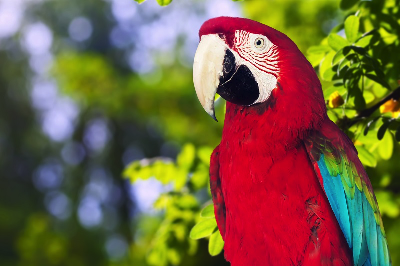



Grayscale Image


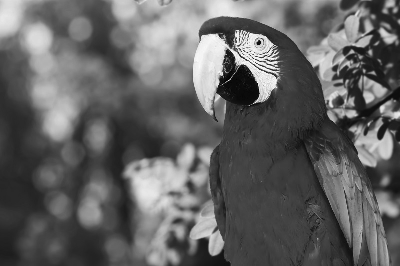



Image After Canny Edge Detection


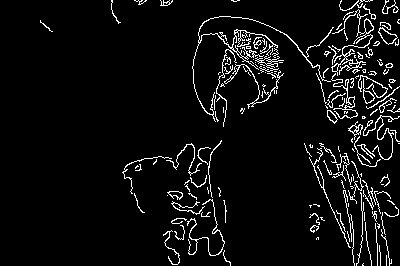

In [ ]:
parrot = cv2.imread("/content/drive/My Drive/Colab Notebooks/single-parrot-small.png")
print('Original Image')
cv2_imshow(parrot)

print('\n')

print('Grayscale Image')
gray_image = cv2.cvtColor(parrot, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

print('\n')

print('Image After Canny Edge Detection')
edges = cv2.Canny(gray_image, 100, 200)
cv2_imshow(edges)